# Unsupervised Clustering

In [ ]:
%matplotlib inline

import time
import os, os.path
import random
import cv2
import glob
import keras
import matplotlib
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import shutil
import pandas as pd
import numpy as np

## Dataset information

In [2]:
image_folder = '/home/pixelserver/Desktop/work_mdcu/cropped_images/'
anno_file = '/home/pixelserver/Desktop/work_mdcu/annotations_filter.csv'
output_path = '/home/pixelserver/Desktop/work_mdcu/anno_cluster/'
output2_path = '/home/pixelserver/Desktop/work_mdcu/unanno_cluster/'

In [3]:
df = pd.read_csv(anno_file,header=None)
df.head()

,0,1
0,10-3840931-580710-cyst&fatty_11_10.jpg,0
1,10-3840931-580710-cyst&fatty_15_14.jpg,0
2,10-3840931-580710-cyst&fatty_4_3.jpg,0
3,10-3840931-580710-cyst&fatty_5_4.jpg,0
4,100-1156555-170824-fatty&cholecystectomy&commo...,0


In [4]:
def preprocess_img(full_filename):
    img = cv2.imread(full_filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img/255.
    return img

In [5]:
########################################################################
anno_dict = dict()

for i in range(len(df)):
    anno_dict[df[0][i]] = df[1][i]

########################################################################    
    
total_file = 0
labeled_count = 0
unlabeled_count =0

labeled_list = [] # Keep only file name
unlabeled_list = [] # Keep only file name

train_data = [] # Keep the raw data eg. [data0, data1, data2, data3]

test_data = [] # Keep the raw data eg. [data0, data1, data2, data3]
test_anno = [] # Keep the annotation eg. [0, 1, 3, 88]

#########################################################################

for root, dirs, files in os.walk(image_folder):
    for filename in files:
        if filename.endswith(".jpg"):
            full_filename = os.path.join(root, filename)
            if filename in anno_dict.keys():
                labeled_count +=1
                labeled_list.append(filename)
                #test_data.append(preprocess_img(full_filename))
                #test_anno.append(anno_dict[filename])
                #if not os.path.isdir(output_path+str(anno_dict[filename])):
                    #os.mkdir(output_path+str(anno_dict[filename]))
                #shutil.copyfile(full_filename, output_path+str(anno_dict[filename])+"/"+filename)
            else:
                unlabeled_count +=1
                unlabeled_list.append(filename)
                #shutil.copyfile(full_filename, output2_path+filename)
                #train_data.append(preprocess_img(full_filename))
            total_file +=1

In [6]:
print("Total file = %s \nLabeled_count = %s \nUnlabeled_count = %s \nanno_file = %s" %(total_file, labeled_count, unlabeled_count, len(df)))

Total file = 26978 
Labeled_count = 23180 
Unlabeled_count = 3798 
anno_file = 23329


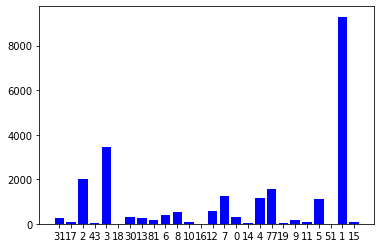

In [7]:
anno_cluster = dict()

for root, dirs, files in os.walk(output_path):
    for filename in files:
        if filename.endswith(".jpg"):
            full_filename = os.path.join(root, filename)
            cluster = full_filename.split("/")[-2]
            if not cluster in anno_cluster.keys():
                anno_cluster[str(cluster)] = 1
            else:
                anno_cluster[str(cluster)] += 1 

plt.bar(list(anno_cluster.keys()), anno_cluster.values(), color='b')
plt.show()

In [8]:
# directory where images are stored
DIR = "./usg_kmean_all"

def dataset_stats():
    
    # This is an array with the letters available.
    # If you add another animal later, you will need to structure its images in the same way
    # and add its letter to this array
    animal_characters = ['A0','B1', 'C2', 'D3', 'E4', 'F5', 'G6', 'H7', 'I8', 'J9', 'K10', 'L11', 'M12', 'N13', 'O14', 'P15', 'Q16', 'R17', 'S18', 'T19', 'U30', 'V31', 'W43', 'X51', 'Y77', 'Z81']
    
    # dictionary where we will store the stats
    stats = []
    
    for animal in animal_characters:
        # get a list of subdirectories that start with this character
        directory_list = sorted(glob.glob("{}/[{}]*".format(DIR, animal)))
        
        for sub_directory in directory_list:
            file_names = [file for file in os.listdir(sub_directory)]
            file_count = len(file_names)
            sub_directory_name = os.path.basename(sub_directory)
            stats.append({ "Code": sub_directory_name[0],
                            "Image count": file_count, 
                           "Folder name": os.path.basename(sub_directory),
                            "File names": file_names})
    
    
    df = pd.DataFrame(stats)
    
    return df

In [9]:
# Show codes with their folder names and image counts
dataset = dataset_stats().set_index("Code")
dataset[["Folder name", "Image count"]]

,Folder name,Image count
Code,,
A,A0-A,296
B,B1-B,9297
C,C2-C,1989
D,D3-D,3464
E,E4-E,1144
F,F5-F,1095
G,G6-G,414
H,H7-H,1232
I,I8-I,520


### Loading the images

In [32]:
# Function returns an array of images whoose filenames start with a given set of characters
# after resizing them to 224 x 224

def load_images(codes):
    
    # Define empty arrays where we will store our images and labels
    images = []
    labels = []
    
    for code in codes:
        # get the folder name for this code
        folder_name = dataset.loc[code]["Folder name"]
        
        for file in dataset.loc[code]["File names"]:                 
            # build file path
            try:
                file_path = os.path.join(DIR, folder_name, file)

                # Read the image
                image = cv2.imread(file_path)

                # Resize it to 224 x 224
                image = cv2.resize(image, (224,224))

                # Convert it from BGR to RGB so we can plot them later (because openCV reads images as BGR)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Now we add it to our array
                images.append(image)
                labels.append(code)
            except Exception as e:
                print(file)

    return images, labels

#### Now we chose our codes for the breeds that we want and load the images and labels

In [33]:
codes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']
images, labels = load_images(codes)

### Photo time!

In [77]:
def show_random_images(images, labels, number_of_images_to_show=3):

    for code in list(set(labels)):

        indicies = [i for i, label in enumerate(labels) if label == code]
        random_indicies = [random.choice(indicies) for i in range(number_of_images_to_show)]
        print(random_indicies)
        figure, axis = plt.subplots(1, number_of_images_to_show, figsize=(30,30))

        print("{} random images for code {}".format(number_of_images_to_show, code))

        for image in range(number_of_images_to_show):
            axis[image].imshow(images[random_indicies[image]])
        plt.show()

### Normalise...

In [36]:
def normalise_images(images, labels):

    # Convert to numpy arrays
    images = np.array(images, dtype=np.float32)
    labels = np.array(labels)

    # Normalise the images
    images /= 255.
    
    return images, labels

In [37]:
images, labels = normalise_images(images, labels)

### Train_test_split

In [38]:
def shuffle_data(images, labels):

    # Set aside the testing data. We won't touch these until the very end.
    X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=1, random_state=728)
    
    return X_train, y_train

In [39]:
X_train, y_train = shuffle_data(images, labels)

In [40]:
y_train_idx = np.array([codes.index(d) for d in y_train])

In [41]:
images.shape

(23180, 224, 224, 3)

In [42]:
X_train.shape

(23179, 224, 224, 3)

In [44]:
#show_random_images(X_train, y_train_idx, number_of_images_to_show=4)

## VGG16 features tranform

In [26]:
vgg16_model = keras.applications.vgg16.VGG16(include_top=False, weights="imagenet", input_shape=(224,224,3))

In [45]:
def covnet_transform(covnet_model, raw_images):

    # Pass our training data through the network
    pred = covnet_model.predict(raw_images)

    # Flatten the array
    flat = pred.reshape(raw_images.shape[0], -1)
    
    return flat

In [46]:
X_train_flat = X_train.reshape((23179,-1))

In [48]:
vgg16_output = covnet_transform(vgg16_model, X_train)
print("VGG16 flattened output has {} features".format(vgg16_output.shape[1]))

VGG16 flattened output has 25088 features


## PCA

In [66]:
def create_fit_PCA(data, n_components=800):
    
    p = PCA(n_components=n_components, random_state=728)
    p.fit(data)
    
    return p

In [67]:
vgg16_pca = create_fit_PCA(vgg16_output)

In [68]:
# Function to plot the cumulative explained variance of PCA components
# This will help us decide how many components we should reduce our features to
def pca_cumsum_plot(pca):
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')
    plt.show()

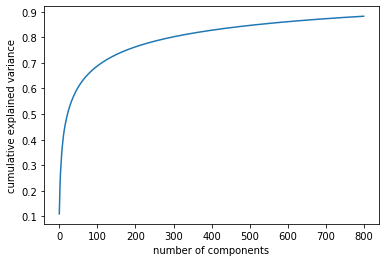

In [69]:
pca_cumsum_plot(vgg16_pca)

In [70]:
# PCA transformations of covnet outputs
vgg16_output_pca = vgg16_pca.transform(vgg16_output)

In [71]:
vgg16_output_pca.shape

(23179, 800)

## PCA-visualuze

In [111]:
vgg16_pca_viz = create_fit_PCA(vgg16_output_pca, n_components=2)

In [112]:
vgg16_output_pca_viz = vgg16_pca_viz.transform(vgg16_output_pca)

In [113]:
vgg16_output_pca_viz.shape

(23179, 2)

## K-mean time

In [72]:
def create_train_kmeans(data, number_of_clusters=len(codes)):
    # n_jobs is set to -1 to use all available CPU cores. This makes a big difference on an 8-core CPU
    # especially when the data size gets much bigger. #perfMatters
    
    k = KMeans(n_clusters=number_of_clusters, n_jobs=-1, random_state=728)

    # Let's do some timings to see how long it takes to train.
    start = time.time()

    # Train it up
    k.fit(data)

    # Stop the timing 
    end = time.time()

    # And see how long that took
    print("Training took {} seconds".format(end-start))
    
    return k

## K=3

K=3
Training took 3.1858856678009033 seconds
[3682, 468, 15903, 8769, 14260, 1102, 3222, 11946, 12442, 9473, 9984, 6514, 4643, 9298]
14 random images for code 0


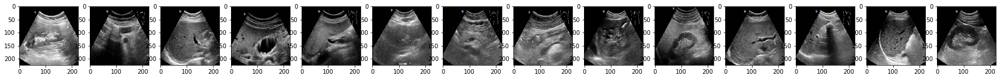

[13389, 20286, 4537, 7198, 11346, 16815, 8944, 11379, 5570, 2376, 14105, 19364, 20261, 8198]
14 random images for code 1


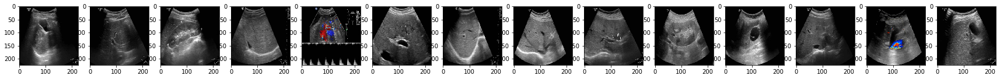

[12792, 5719, 14843, 1585, 17315, 4161, 15211, 13117, 15625, 14471, 5166, 17384, 15107, 13221]
14 random images for code 2


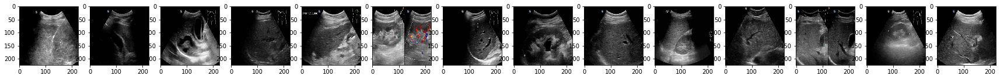

In [79]:
print("K=3")
K_vgg16_pca_3 = create_train_kmeans(vgg16_output_pca, number_of_clusters=3)
k_vgg16_pred_pca_3 = K_vgg16_pca_3.predict(vgg16_output_pca)
show_random_images(X_train, k_vgg16_pred_pca_3, number_of_images_to_show=14)

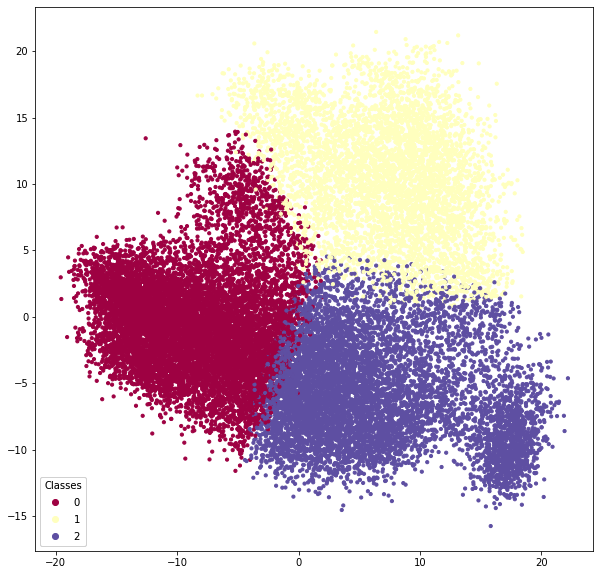

In [115]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_3, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{2: 8112, 0: 10218, 1: 4849}


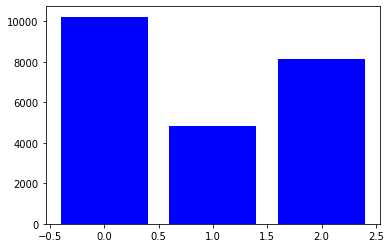

In [101]:
count_cluster = dict()

for i in k_vgg16_pred_pca_3:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  

plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=5

K=5
Training took 4.982245683670044 seconds
[22606, 10143, 16688, 8602, 7317, 4926, 10691, 5127, 14120, 2909, 3009, 16395, 6814, 1692]
14 random images for code 0


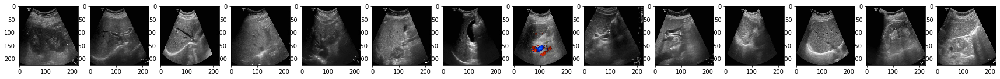

[8109, 1646, 7713, 3617, 20675, 1648, 3532, 7784, 18133, 2533, 13367, 17282, 7251, 10966]
14 random images for code 1


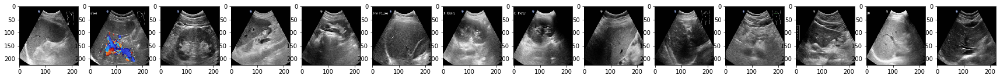

[22390, 13582, 22404, 10668, 22933, 3417, 2826, 16517, 16133, 17509, 7222, 8320, 11391, 20984]
14 random images for code 2


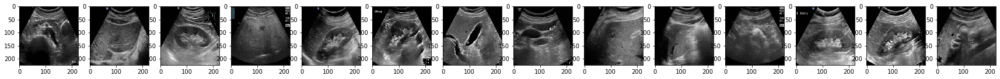

[22111, 22133, 15052, 1749, 20291, 1408, 22440, 14802, 8725, 6198, 9218, 10475, 2220, 409]
14 random images for code 3


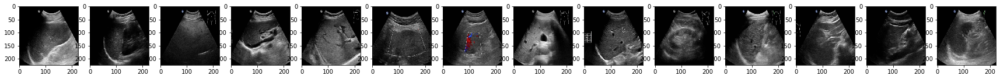

[5784, 530, 8603, 7994, 12410, 12738, 6913, 12738, 16792, 16100, 1090, 22941, 247, 23007]
14 random images for code 4


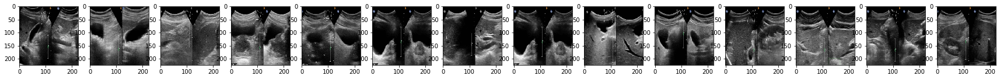

In [80]:
print("K=5")
K_vgg16_pca_5 = create_train_kmeans(vgg16_output_pca, number_of_clusters=5)
k_vgg16_pred_pca_5 = K_vgg16_pca_5.predict(vgg16_output_pca)
show_random_images(X_train, k_vgg16_pred_pca_5, number_of_images_to_show=14)

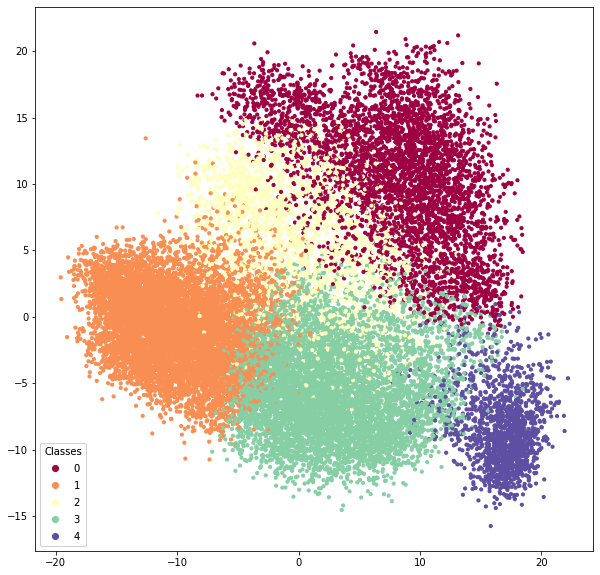

In [116]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_5, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{3: 7006, 1: 8006, 2: 2406, 0: 4206, 4: 1555}


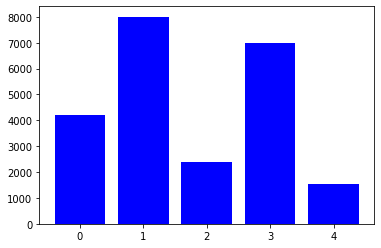

In [102]:
count_cluster = dict()

for i in k_vgg16_pred_pca_5:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=6

K=6
Training took 5.985135793685913 seconds
[21037, 647, 12029, 9752, 7085, 3290, 19173, 5386, 7268, 17572, 21703, 11768, 22422, 22888]
14 random images for code 0


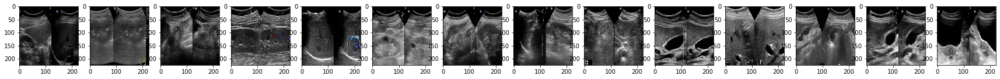

[15524, 18331, 6821, 2328, 13845, 15500, 1256, 13126, 16391, 17021, 17719, 9053, 8906, 12483]
14 random images for code 1


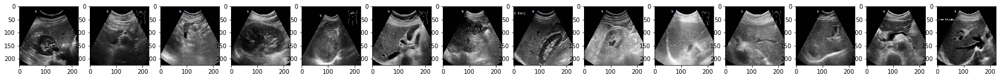

[15116, 16731, 14117, 2744, 6428, 16154, 17842, 8438, 5442, 14820, 16700, 7332, 14289, 142]
14 random images for code 2


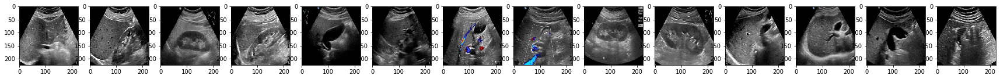

[16253, 3495, 1672, 16245, 1607, 1921, 15656, 2384, 10669, 14357, 18082, 15919, 14546, 22600]
14 random images for code 3


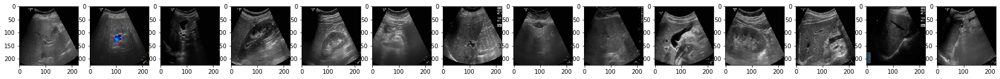

[4866, 4504, 10891, 19934, 5768, 1159, 22227, 3710, 4407, 1706, 18019, 4900, 18838, 2503]
14 random images for code 4


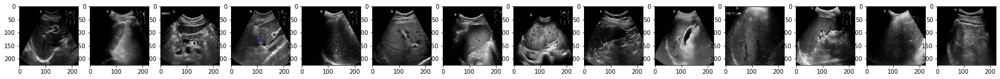

[7349, 20115, 2398, 5528, 5779, 11104, 5240, 6360, 1698, 15376, 15655, 15822, 12898, 2966]
14 random images for code 5


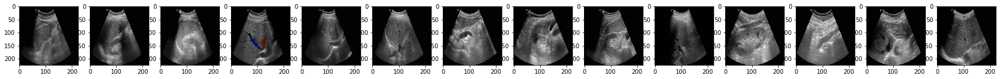

In [81]:
print("K=6")
K_vgg16_pca_6 = create_train_kmeans(vgg16_output_pca, number_of_clusters=6)
k_vgg16_pred_pca_6 = K_vgg16_pca_6.predict(vgg16_output_pca)
show_random_images(X_train, k_vgg16_pred_pca_6, number_of_images_to_show=14)

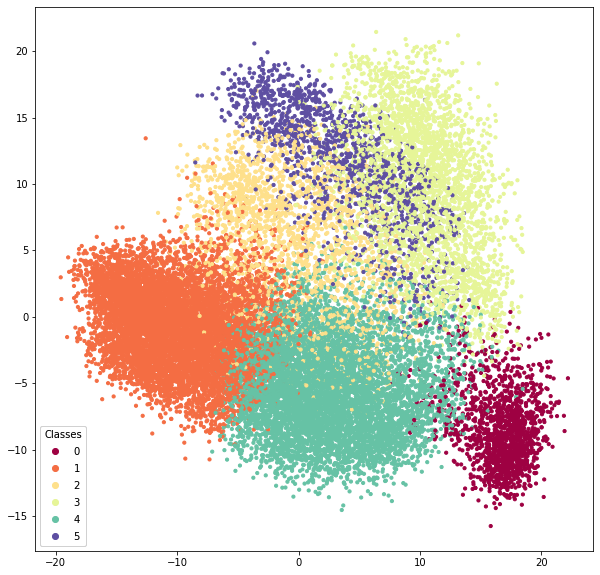

In [117]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_6, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{4: 6999, 1: 7954, 2: 2239, 3: 3019, 0: 1542, 5: 1426}


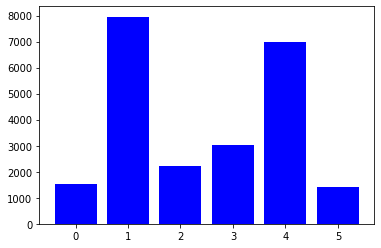

In [103]:
count_cluster = dict()

for i in k_vgg16_pred_pca_6:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=10

K=10
Training took 9.739681482315063 seconds
[16146, 21356, 4587, 16958, 9011, 14305, 15684, 17837, 5960, 14560, 8847, 19571, 5357, 14644]
14 random images for code 0


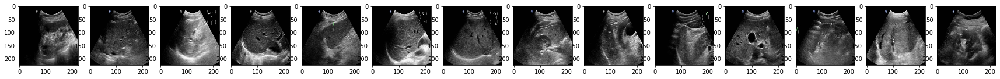

[6466, 18100, 11927, 17593, 3125, 18347, 14808, 5989, 20912, 20202, 7561, 19070, 7128, 7537]
14 random images for code 1


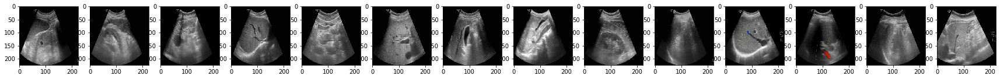

[6668, 11561, 13208, 19698, 10948, 9173, 22977, 16791, 5431, 21535, 16519, 212, 11972, 5968]
14 random images for code 2


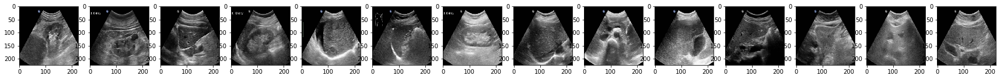

[17001, 7270, 9105, 5744, 15219, 8529, 7086, 13471, 13964, 6902, 11003, 13700, 8354, 712]
14 random images for code 3


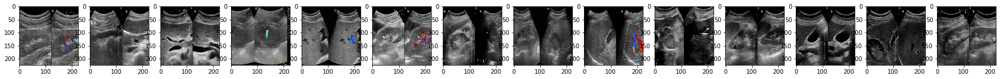

[11465, 1151, 17864, 17015, 253, 18022, 18491, 13600, 6363, 15273, 11688, 22349, 6785, 8419]
14 random images for code 4


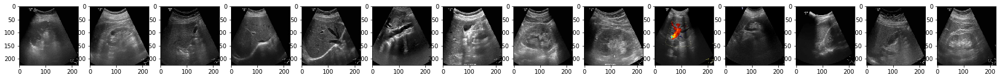

[19702, 14352, 14143, 12462, 4051, 23165, 1680, 16409, 12300, 14941, 10782, 13345, 4202, 948]
14 random images for code 5


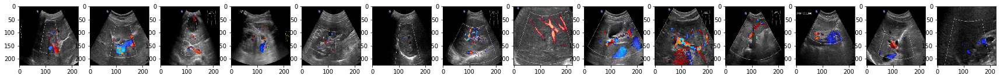

[14526, 21837, 14480, 1173, 8281, 5146, 3188, 4421, 15214, 17800, 20731, 22438, 8666, 148]
14 random images for code 6


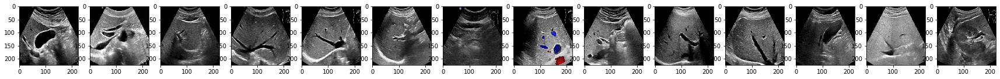

[195, 2962, 20203, 21006, 18647, 9855, 16238, 10988, 1711, 23031, 6613, 17833, 3307, 15930]
14 random images for code 7


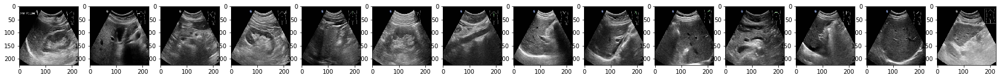

[15898, 7790, 1886, 8956, 10581, 2935, 21345, 10553, 14546, 4948, 19241, 1053, 1036, 2473]
14 random images for code 8


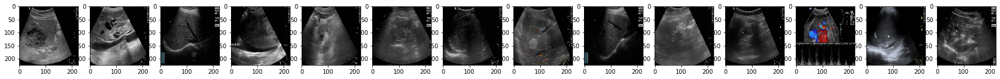

[2232, 10438, 6192, 21861, 18895, 22778, 21122, 1229, 294, 21226, 22920, 9256, 20127, 7263]
14 random images for code 9


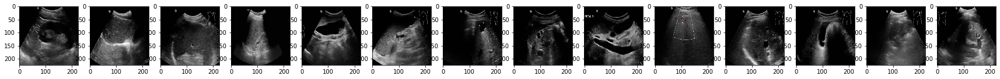

In [82]:
print("K=10")
K_vgg16_pca_10 = create_train_kmeans(vgg16_output_pca, number_of_clusters=10)
k_vgg16_pred_pca_10 = K_vgg16_pca_10.predict(vgg16_output_pca)
show_random_images(X_train, k_vgg16_pred_pca_10, number_of_images_to_show=14)

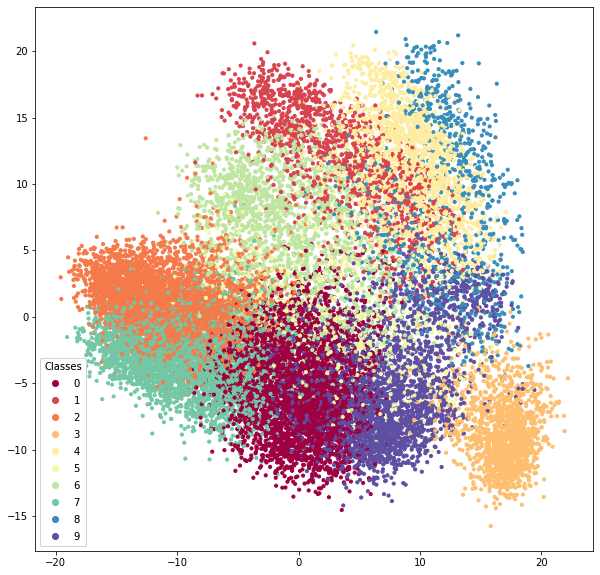

In [118]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_10, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{0: 4210, 9: 2771, 7: 3547, 8: 902, 4: 1859, 3: 1515, 6: 2007, 2: 4190, 5: 829, 1: 1349}


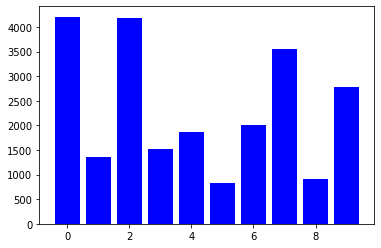

In [104]:
count_cluster = dict()

for i in k_vgg16_pred_pca_10:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=15

K=15
Training took 18.184027194976807 seconds
[13851, 17633, 7076, 22186, 11986, 18181, 22520, 22112, 4935, 4390, 12146, 6885, 7269, 18951]
14 random images for code 0


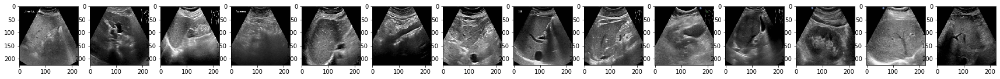

[17986, 8805, 8697, 9659, 5470, 18437, 6992, 20249, 6867, 751, 3764, 3764, 18202, 8182]
14 random images for code 1


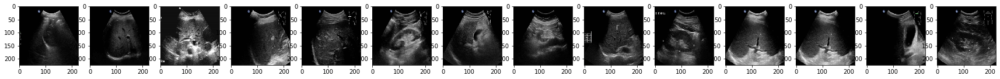

[7350, 6453, 20853, 809, 20129, 475, 8288, 17735, 1201, 5832, 3831, 4428, 17757, 6882]
14 random images for code 2


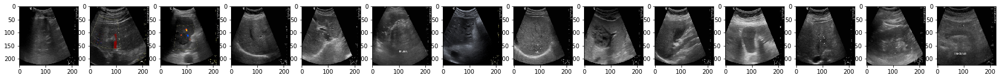

[8809, 12299, 16684, 9849, 8809, 9603, 3169, 14458, 13383, 4486, 13640, 4985, 13640, 18841]
14 random images for code 3


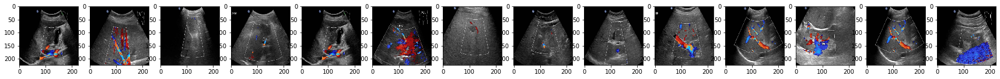

[19196, 20679, 6500, 15204, 16037, 22361, 1039, 17879, 21887, 1502, 6648, 4254, 6294, 14521]
14 random images for code 4


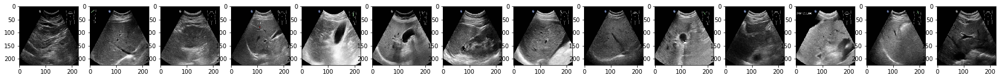

[5440, 3619, 5012, 426, 19750, 6532, 6532, 5821, 6045, 14624, 186, 10169, 16619, 19368]
14 random images for code 5


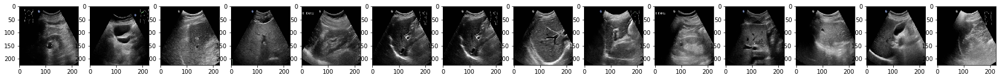

[16766, 10688, 4310, 22379, 1652, 14158, 878, 670, 16524, 9221, 14325, 12225, 21249, 16669]
14 random images for code 6


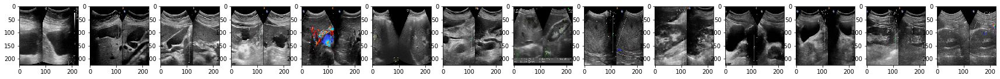

[20446, 20114, 13472, 9747, 18870, 1811, 13155, 15892, 21473, 7760, 14009, 16347, 18462, 3689]
14 random images for code 7


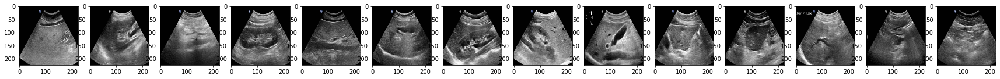

[17194, 9882, 10724, 6360, 14146, 7149, 4725, 19180, 15402, 10220, 19595, 783, 15540, 10377]
14 random images for code 8


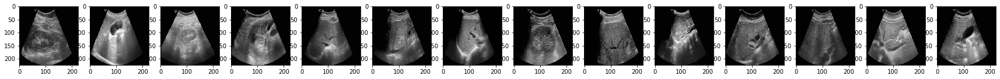

[21814, 17237, 13404, 8860, 2707, 8453, 3275, 6375, 5235, 5414, 19306, 8444, 14294, 6627]
14 random images for code 9


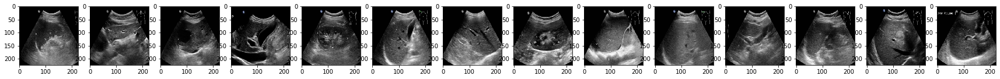

[14789, 12385, 22588, 19659, 21273, 20810, 1185, 18660, 15122, 21812, 1487, 19673, 7484, 22737]
14 random images for code 10


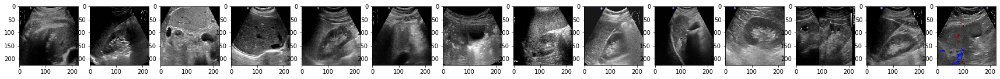

[5930, 23119, 4324, 10062, 7878, 806, 18790, 3660, 9485, 17227, 6247, 15090, 7765, 7328]
14 random images for code 11


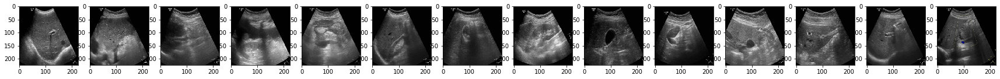

[8371, 5810, 13631, 23120, 14969, 12589, 21589, 17663, 15390, 10198, 1810, 10310, 3458, 15118]
14 random images for code 12


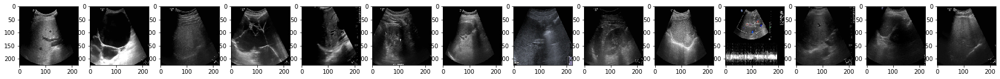

[13464, 2173, 16702, 280, 17215, 18182, 8162, 2328, 18045, 6654, 18335, 12760, 11496, 13436]
14 random images for code 13


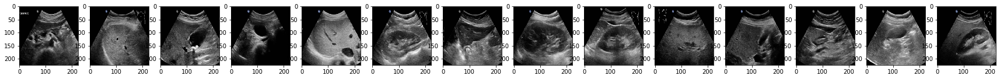

[529, 8031, 1260, 21341, 650, 15656, 5464, 6072, 17062, 21053, 22868, 21053, 26, 20005]
14 random images for code 14


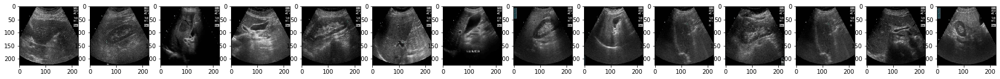

In [97]:
print("K=15")
K_vgg16_pca_15 = create_train_kmeans(vgg16_output_pca, number_of_clusters=15)
k_vgg16_pred_pca_15 = K_vgg16_pca_15.predict(vgg16_output_pca)
show_random_images(X_train, k_vgg16_pred_pca_15, number_of_images_to_show=14)

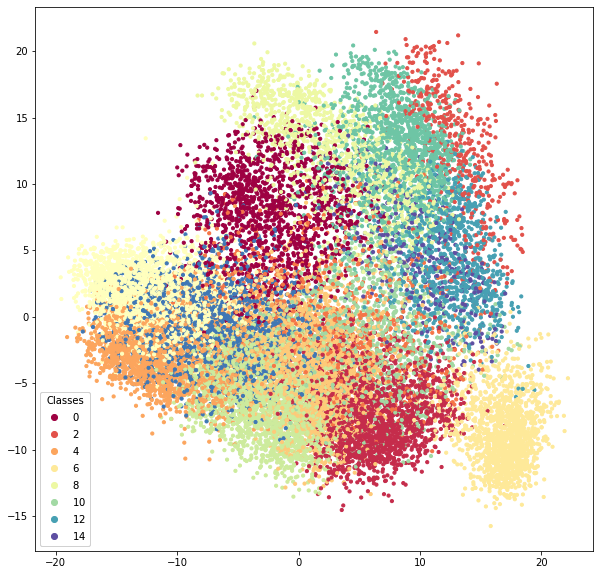

In [119]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_15, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{5: 2407, 1: 1858, 13: 2214, 10: 1100, 9: 2172, 14: 359, 11: 1388, 6: 1522, 0: 1436, 12: 975, 4: 2374, 3: 806, 2: 474, 7: 2812, 8: 1282}


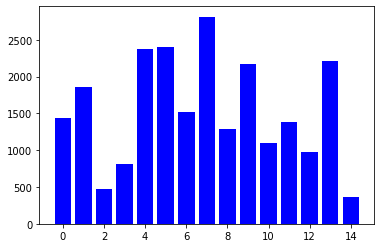

In [105]:
count_cluster = dict()

for i in k_vgg16_pred_pca_15:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster) 
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()